In [38]:
using Pkg
Pkg.activate("..")

  Activating project at `~/Library/Mobile Documents/com~apple~CloudDocs/grad-school/solis-lab/phylo-vaes/asr-ae`


In [39]:
using DelimitedFiles
using Plots
using ArDCA
using PlmDCA
using adabmDCA
using PottsEvolver
using StatsBase
using LinearAlgebra
using JLD2

In [84]:
function get_contact_scores(file_path::String)
    lines = readlines(file_path)
    vec_scores = Tuple{Int, Int, Float64}[]
    for line in lines
        parts = split(line)
        if length(parts) == 3
            i = parse(Int, parts[1])
            j = parse(Int, parts[2])
            val = parse(Float64, parts[3])
            push!(vec_scores, (i, j, val)) 
        end
    end
    return vec_scores
end

function get_contact_mat(
    contact_scores::AbstractVector{Tuple{I1, I2, F}}
) where {I1<:Integer, I2<:Integer, F<:AbstractFloat}

    if isempty(contact_scores)
        return Matrix{Float64}(undef, 0, 0)
    end

    all_indices = Iterators.flatten((t[1], t[2]) for t in contact_scores)
    min_idx, max_idx = extrema(all_indices)

    # Determine the size and offset needed to handle 0- or 1-based indexing
    # If min_idx is 0, we need to add 1 to all indices. If it's 1, we add 0.
    offset = 1 - min_idx
    matrix_size = max_idx + offset
    
    contact_matrix = fill(NaN, matrix_size, matrix_size)
    for (i, j, val) in contact_scores
        contact_matrix[i + offset, j + offset] = val
        contact_matrix[j + offset, i + offset] = val
    end

    return contact_matrix
end

function plot_heatmap(mat)
    heatmap(mat,
        c=:coolwarm,
        title="Contact Scores Heatmap",
        xlabel="Residue Index",
        ylabel="Residue Index",
        size=(500, 400))
    #savefig(output_path)
end

plot_heatmap (generic function with 1 method)

In [41]:
fasta_file = joinpath("..", "msas", "real", "processed", "PF00565", "seq_msa_char.fasta")
ardca_model_file = joinpath("..", "msas", "ardca", "pf00565_model.jld2")
bmdca_model_file = joinpath("..", "msas", "potts", "pf00565_params_intindex.dat")
bmdca_contact_file = joinpath("..", "msas", "potts", "pf00565_frobenius.txt")

"../msas/potts/pf00565_frobenius.txt"

### ARDCA

In [42]:
arnet, arvar = load(ardca_model_file, "arnet", "arvar")

(ArNet [N=98 q=21], ArVar [N=98 M=6591 q=21 λJ = 0.01 λH = 0.01 Z::Int8])

In [43]:
target_seq = 1 #arbitrary (see https://pagnani.github.io/ArDCA.jl/dev/#2.-Contact-Prediction)
ar_scores = epistatic_score(arnet, arvar, target_seq);

### PLMDCA

In [65]:
# Actually fit model with pseudolikelihood
out_plm = plmdca_sym(fasta_file, verbose=false); 
# alternatively, for faster approach (not sure what difference between symmetric and assymetric versions is):
#plmdca_asym(fasta_file, verbose=false)

removing duplicate sequences... done: 10312 -> 6591
θ = 0.4437100031938736 threshold = 43.0
M = 6591 N = 98 Meff = 531.2402607862541


In [66]:
plm_scores = out_plm.score;

### BMDCA

In [44]:
out_bmdca = PottsEvolver.read_graph(bmdca_model_file)

PottsGraph{Float64}: dimensions (L=98, q=21) -- β=1.0 -- Alphabet{Char,UInt8}: ['-', 'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']

In [13]:
bm_scores = get_contact_scores(bmdca_contact_file);
sort!(bm_scores, by=x->x[3], rev=true);

## Compare

#### Compare the h and J tensors of DCA fit with plm versus fit with bm.

In [77]:
println(corspearman(vec(out_plm.htensor[1:20,:]), vec(out_bmdca.h[2:21,:])))
#scatter(vec(out_plm.htensor[1:20,:]), vec(out_bmdca.h[2:21,:]))

0.8954845803540178


In [78]:
println(corspearman(vec(out_plm.Jtensor[1:20,1:20,:,:]), vec(out_bmdca.J[2:21,2:21,:,:])))
#scatter(vec(out_plm.Jtensor[1:20,1:20,:,:])[1:10000], vec(out_bmdca.J[2:21,2:21,:,:])[1:10000])

0.6370498461263645


#### Compare contact scores

In [69]:
ar_mat = get_contact_mat(ar_scores);
plm_mat = get_contact_mat(plm_scores);
bm_mat = get_contact_mat(bm_scores);

In [70]:
println("AR to PLM: ", round( corspearman( vec(ar_mat[.!I(98)]), vec(plm_mat[.!I(98)]) ) , sigdigits=3))
println("AR to BM: ", round( corspearman( vec(ar_mat[.!I(98)]), vec(bm_mat[.!I(98)]) ) , sigdigits=3))
println("BM to PLM: ", round( corspearman( vec(bm_mat[.!I(98)]), vec(plm_mat[.!I(98)]) ) , sigdigits=3))

AR to PLM: 0.79
AR to BM: 0.29
BM to PLM: 0.354


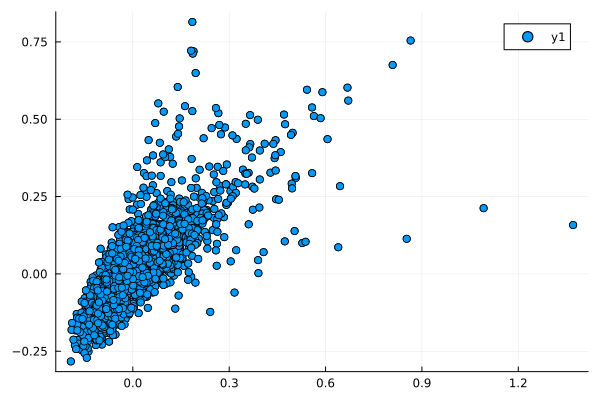

In [79]:
scatter(vec(plm_mat), vec(ar_mat))

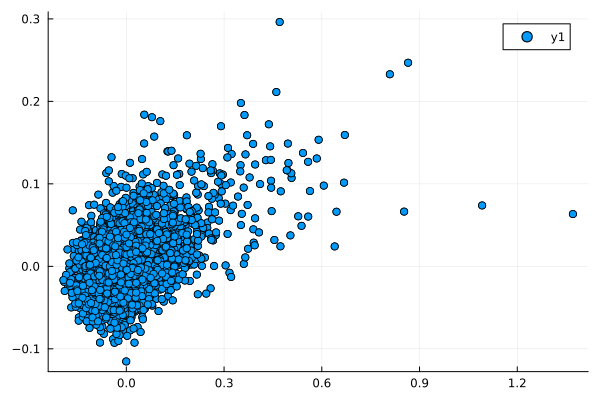

In [80]:
scatter(vec(plm_mat), vec(bm_mat))

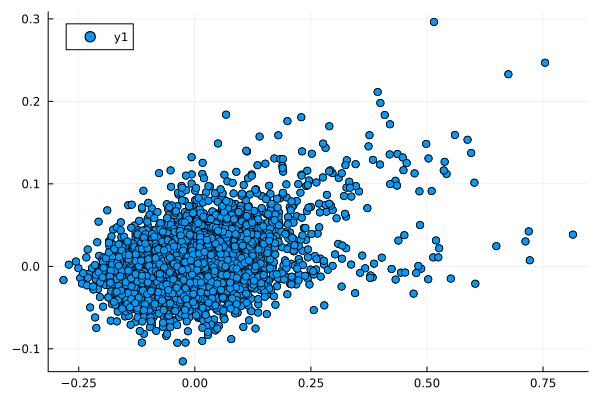

In [81]:
scatter(vec(ar_mat), vec(bm_mat))

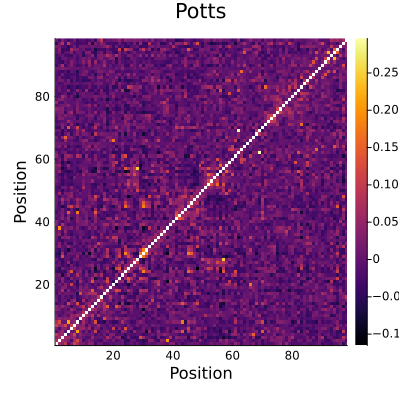

In [88]:
p_bm = heatmap(bm_mat,
        title="Potts",
        xlabel="Position",
        ylabel="Position",
        size=(400, 400)
        )

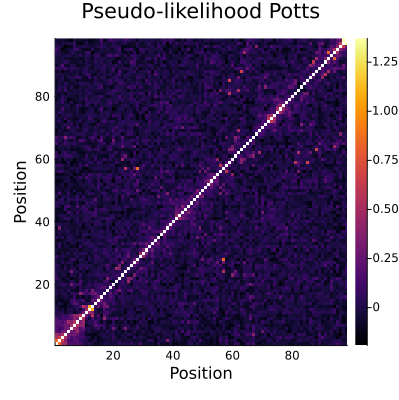

In [75]:
p_plm = heatmap(plm_mat,
        title="Pseudo-likelihood Potts",
        xlabel="Position",
        ylabel="Position",
        size=(400, 400)
        )

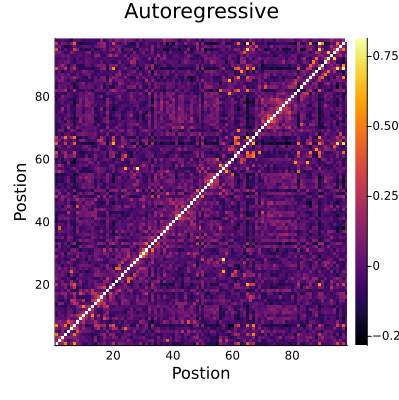

In [76]:
p_ar = heatmap(ar_mat,
        title="Autoregressive",
        xlabel="Postion",
        ylabel="Postion",
        size=(400, 400)
        )

In [78]:
 fig = plot(p_bm, p_ar, layout = (1, 2), size = (800, 400), margin = 3Plots.mm)
 savefig("../figures/contact_map.pdf")

"/Users/evangorstein/Documents/grad_school/solis-lab/phylo-vaes/asr-ae/figures/contact_map.pdf"